In [ ]:
#importing the necessary scikit learn libraries and uploading the data set on World Happiness Rankings
import sklearn 
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import neighbors
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn import datasets, neighbors
from mlxtend.plotting import plot_decision_regions
from sklearn.dummy import DummyRegressor
from google.colab import drive
import pandas as pd
drive.mount('/content/drive')
happiness =pd.read_csv('/content/drive/MyDrive/Google_Colab/happiness_data.csv')
happiness.head()

Mounted at /content/drive


,Overall rank,Year,Country or region,Score,GDP per capita,Social support and Family,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption
0,1,2018,Finland,7.632,1.305,1.592,0.874,0.681,0.202,0.393
1,2,2018,Norway,7.594,1.456,1.582,0.861,0.686,0.286,0.340
2,3,2018,Denmark,7.555,1.351,1.590,0.868,0.683,0.284,0.408
3,4,2018,Iceland,7.495,1.343,1.644,0.914,0.677,0.353,0.138
4,5,2018,Switzerland,7.487,1.420,1.549,0.927,0.660,0.256,0.357


The goal of this project is to determine which features affect a country's happiness ranking the most. The features will be represented as the predictor variables that will predict the target variable, which is the happiness score. The predictor variables will include the columns "Country or region", "GDP per capita", "Social support and Family", "Healthy life expectancy", "Freedom to make life choices", "Generosity", and "Perceptions of corruption." 

In [ ]:
#Getting rid of missing data
happiness.isna().any()
happiness.fillna(happiness["Perceptions of corruption"].median(),inplace=True)
happiness.isna().any()

Overall rank                    False
Year                            False
Country or region               False
Score                           False
GDP per capita                  False
Social support and Family       False
Healthy life expectancy         False
Freedom to make life choices    False
Generosity                      False
Perceptions of corruption       False
dtype: bool

In order to prepare my data for the experiment, I first checked to see if there were any features from the data set happiness with missing data. Based on the results from executing the function isna().any(), the only feature that had missing data was "Perceptions of corruption." Therefore, I replaced all the missing data values from the feature "Perceptions of corruption" with the median obtained from the existing data values from that column. It's important that none of the features have missing data, because regression machine learning models can only be performed on numerical values and not NaN values.

I used the Mean Squared Error metric to test all of the machine learning models to decide which one is optimal, because the target variable only includes numerical values. Hence, the target variable can only be predicted using regression, and the Mean Squared Error is a regression metric.

In [ ]:
#creating a baseline performance model and evaluating its accuracy using the mean squared error
predictor_dummy_variables = ["GDP per capita","Social support and Family","Healthy life expectancy","Freedom to make life choices","Generosity","Perceptions of corruption"]
target_dummy_variable = "Score"
train_dummy_data, test_dummy_data, train_dummy_solution, test_dummy_solution = \
train_test_split(happiness[predictor_dummy_variables], happiness[target_dummy_variable], test_size = 0.2)
baseline_performance = DummyRegressor()
baseline_performance.fit(train_dummy_data, train_dummy_solution)
baseline_performance_prediction = baseline_performance.predict(test_dummy_data)
print("MSE: " + str(metrics.mean_squared_error(baseline_performance_prediction, test_dummy_solution)))

MSE: 1.294053557570767


The baseline for my metric is a mean squared error of around 0.973 (it may have slightly different values now, but when I executed the code on Tuesday, March 30th it was around 0.973). This means that if I always guessed the average or always guessed randomly, my machine learning model's accuracy would result in a mean squared error of around 0.973 or greater. After testing out all of my machine learning models, which are displayed later, they all resulted in mean squared errors less than 0.973. Therefore, all of my models performed decently well. Yet, as it will be shown later, I tested out and tuned the parameters of all of my models in order to determine the best machine learning model for predicting the happiness score.

I tried the following machine learning models: Decision Trees, KNN, Weighted KNN, and Random Forests. I will create a graph of each machine learning model, observing how their lowest mean squared errors change as I tune certain parameters. For Decision Trees, I will tune their maximum depths when it comes to displaying their nodes at different random states. For KNN models, I will tune the k-nearest neighbors they will use, as well as the p that is used for determining which distance metric will be used; these parameters will be tuned at different random states. For Weighted KNN, the same parameters will be tuned as in KNN at different random states. Finally, for Random Forests, the number of decision trees that will be used for predicting the happiness score will be tuned at different random states. By analyzing the mean squared errors of my machine learning models at four different random states (41, 66, 158, and no random state), I hope to make the experimental results of my machine learning models more precise. Random states indicate how often a machine learning model performs on different training examples. Hence, the greater the random state, the more often my machine learning models would be exposed to different training examples, which allows me to determine whether similarly tuned parameter values from models with different random states results in similar mean squared error values. With no random state, I can then fully verify my previous findings, since not having a random state means a machine learning model is exposed to different training examples every time.

In [ ]:
#https://heartbeat.fritz.ai/implementing-regression-using-a-decision-tree-and-scikit-learn-ac98552b43d7 - used that source for investigating how to implement a decision tree
#when using regression, as well as gaining a better understanding of its parameters
#creating a Python function that takes in the parameter max_depth that will be tuned when implementing decision trees
def creatingDecisionTreeRegressor(max_depth, random_state):
  predictor_variables = ["GDP per capita","Social support and Family","Healthy life expectancy","Freedom to make life choices","Generosity","Perceptions of corruption"]
  target_variable = "Score"
  if random_state == 0:
    train_data, test_data, train_solution, test_solution = \
    train_test_split(happiness[predictor_variables], happiness[target_variable], test_size = 0.2)
    decision_tree = tree.DecisionTreeRegressor(max_depth=max_depth, random_state=random_state, max_features=6) #max number of features
    decision_tree.fit(train_data, train_solution)
    decision_tree_prediction = decision_tree.predict(test_data)
  else:
    train_data, test_data, train_solution, test_solution = \
    train_test_split(happiness[predictor_variables], happiness[target_variable], test_size = 0.2, random_state = random_state)
    decision_tree = tree.DecisionTreeRegressor(max_depth=max_depth, random_state=random_state, max_features=6) #max number of features
    decision_tree.fit(train_data, train_solution)
    decision_tree_prediction = decision_tree.predict(test_data)

  
  return metrics.mean_squared_error(test_solution, decision_tree_prediction)

No handles with labels found to put in legend.


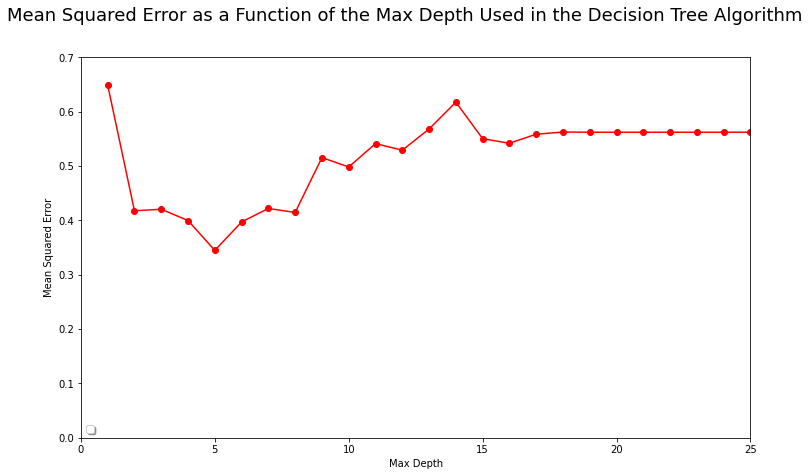

In [ ]:
#https://www.geeksforgeeks.org/change-plot-size-in-matplotlib-python/ - used that source for determining how to change the size of the graph I display
#graphing the mean squared error values as a function of the max_depth values for decision trees
import matplotlib.pyplot as plt
%matplotlib inline
max_depth_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
mean_squared_error_values = []

for max_depth in max_depth_values:
  mean_squared_error = creatingDecisionTreeRegressor(max_depth, 41)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the Max Depth Used in the Decision Tree Algorithm',fontsize=18)
plt.xlabel('Max Depth')
plt.ylabel('Mean Squared Error')
plt.plot(max_depth_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,25,0,0.7])


plt.show()


No handles with labels found to put in legend.


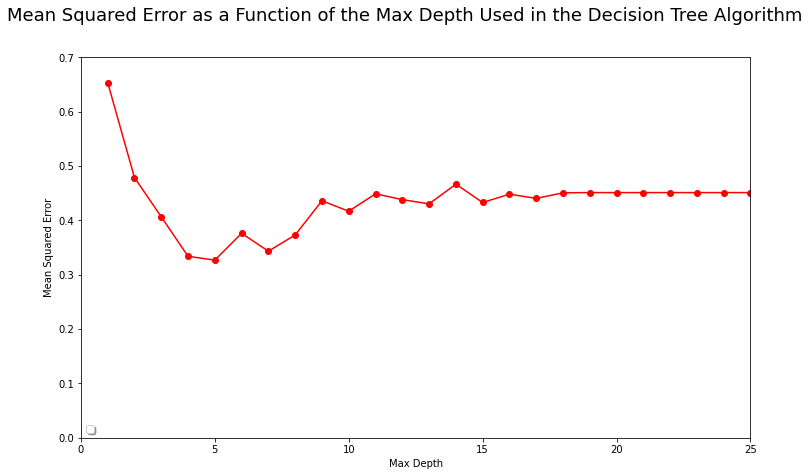

In [ ]:
#https://www.kaggle.com/questions-and-answers/49890 - used this source to get a good understanding of what random_state means


max_depth_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
mean_squared_error_values = []

for max_depth in max_depth_values:
  mean_squared_error = creatingDecisionTreeRegressor(max_depth, 66)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the Max Depth Used in the Decision Tree Algorithm',fontsize=18)
plt.xlabel('Max Depth')
plt.ylabel('Mean Squared Error')
plt.plot(max_depth_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,25,0,0.7])


plt.show()

No handles with labels found to put in legend.


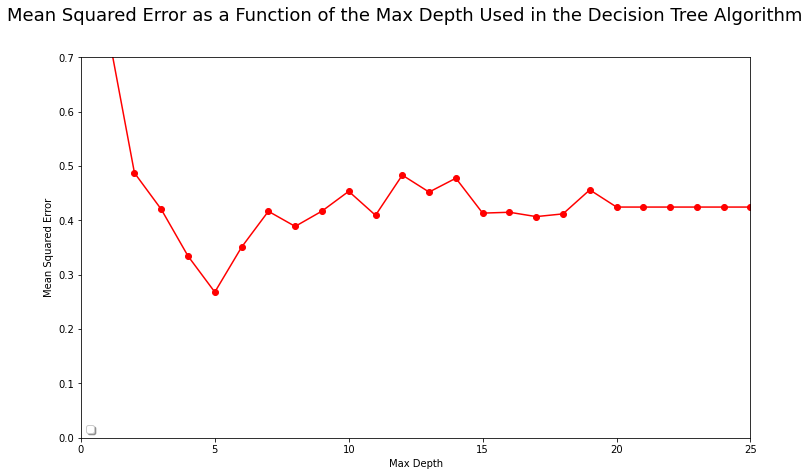

In [ ]:
max_depth_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
mean_squared_error_values = []

for max_depth in max_depth_values:
  mean_squared_error = creatingDecisionTreeRegressor(max_depth, 158)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the Max Depth Used in the Decision Tree Algorithm',fontsize=18)
plt.xlabel('Max Depth')
plt.ylabel('Mean Squared Error')
plt.plot(max_depth_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,25,0,0.7])


plt.show()

No handles with labels found to put in legend.


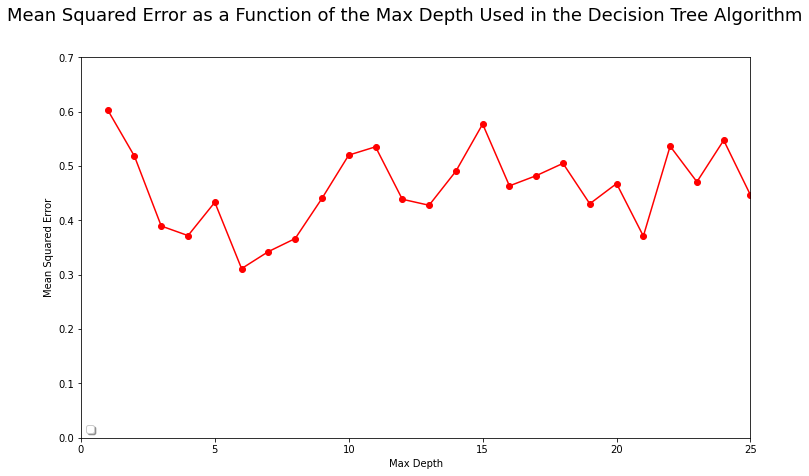

In [ ]:
max_depth_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]
mean_squared_error_values = []

for max_depth in max_depth_values:
  mean_squared_error = creatingDecisionTreeRegressor(max_depth, 0)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the Max Depth Used in the Decision Tree Algorithm',fontsize=18)
plt.xlabel('Max Depth')
plt.ylabel('Mean Squared Error')
plt.plot(max_depth_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,25,0,0.7])


plt.show()

Based on the graphical results from each decision tree with a different random state, the average maximum depth from the maximum depths that yield the lowest mean squared errors is 5.25, which can be rounded down to 5. Therefore, the most optimal decision tree that can be constructed is one that has a maximum depth of 5, with the number of predictor variables staying the same. The optimal decision tree will also have no random state, since the decision tree's fullest accuracy can be evaluated how well the decision tree adapts to different training examples. Here is a picture that illustrates the graphical results from determining the optimal decision tree.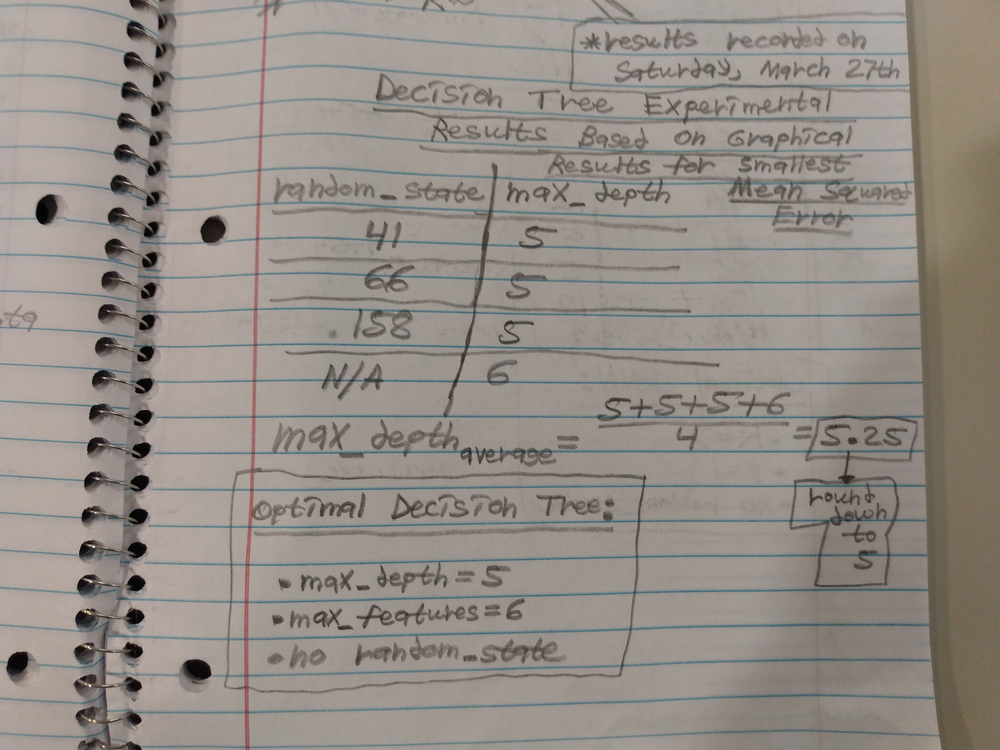

In [ ]:
#Creating a kNN Algorithm
#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html - source
#https://scikit-learn.org/stable/auto_examples/neighbors/plot_regression.html - source
#used both sources to gain a better understanding of the parameters for KNN and weighted KNN algorithms
#creating a Python function  that takes in the parameters k and p that will be tuned when implementing the KNN and weighted KNN algorithms
def creatingKNeighborsRegressor(weight, k, p, random_state):
  predictor_variables = ["GDP per capita","Social support and Family","Healthy life expectancy","Freedom to make life choices","Generosity","Perceptions of corruption"]
  target_variable = "Score"
  if random_state == 0:
    train_data, test_data, train_solution, test_solution = \
    train_test_split(happiness[predictor_variables], happiness[target_variable], test_size = 0.2)
    k_Nearest_Neighbor = neighbors.KNeighborsRegressor(n_neighbors=k, metric='minkowski', p=p, weights=weight)
    k_Nearest_Neighbor.fit(train_data, train_solution)
    k_Nearest_Neighbor_prediction = k_Nearest_Neighbor.predict(test_data)
  else:
    train_data, test_data, train_solution, test_solution = \
    train_test_split(happiness[predictor_variables], happiness[target_variable], test_size = 0.2, random_state = random_state)
    k_Nearest_Neighbor = neighbors.KNeighborsRegressor(n_neighbors=k, p=p, weights=weight)
    k_Nearest_Neighbor.fit(train_data, train_solution)
    k_Nearest_Neighbor_prediction = k_Nearest_Neighbor.predict(test_data)
   

  
  return metrics.mean_squared_error(test_solution, k_Nearest_Neighbor_prediction)

After creating the above Python function, each KNN algorithm for a random state of 41, 66, 158, and no random state will be graphed containing different k values ranging from 1 to 15 and different p values ranging from 1 to 3.

No handles with labels found to put in legend.


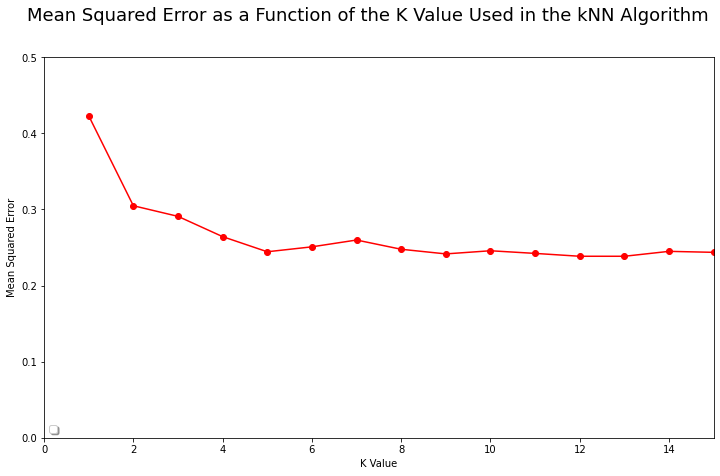

In [ ]:
#graphing the mean squared error values as a function of the k-nearest neighbors and p values for KNN and weighted KNN algorithms
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 1, 41)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


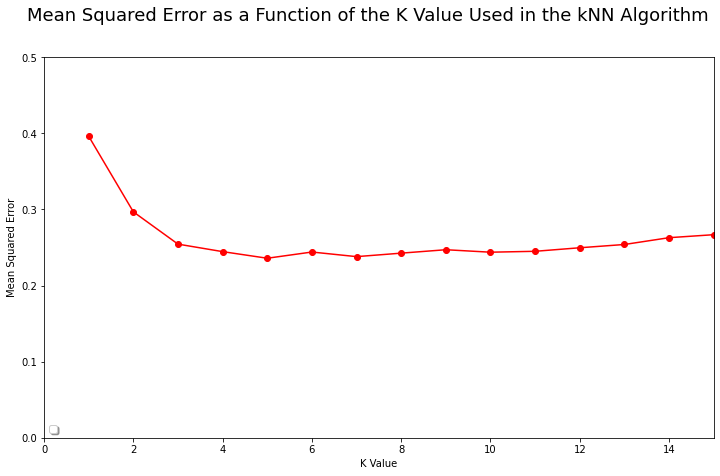

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 1, 66)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


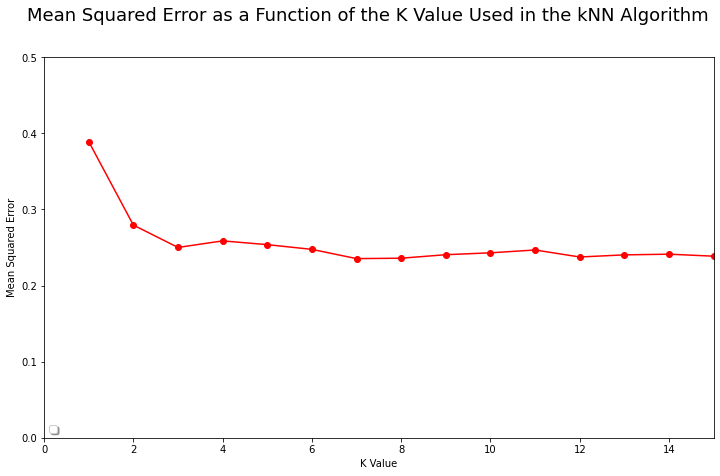

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 1, 158)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


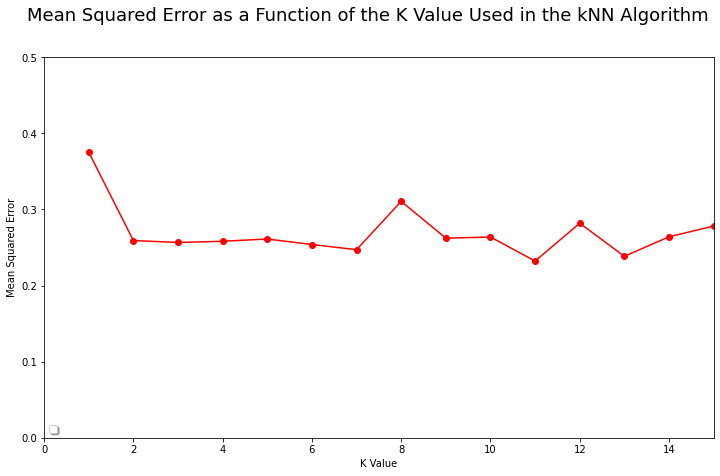

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 1, 0)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


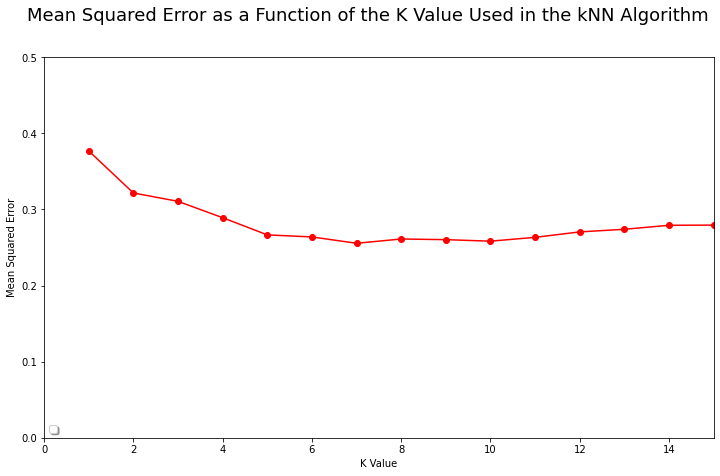

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 2, 41)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


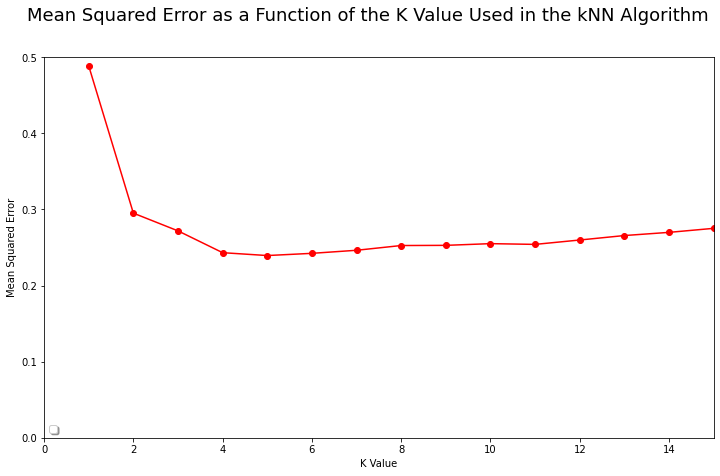

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 2, 66)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


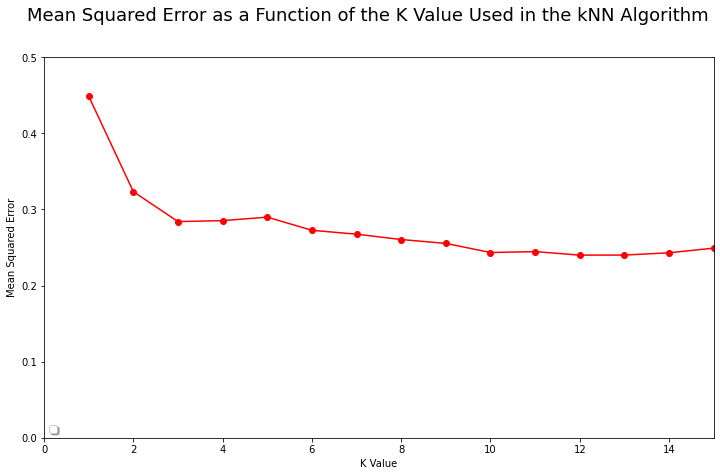

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 2, 158)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


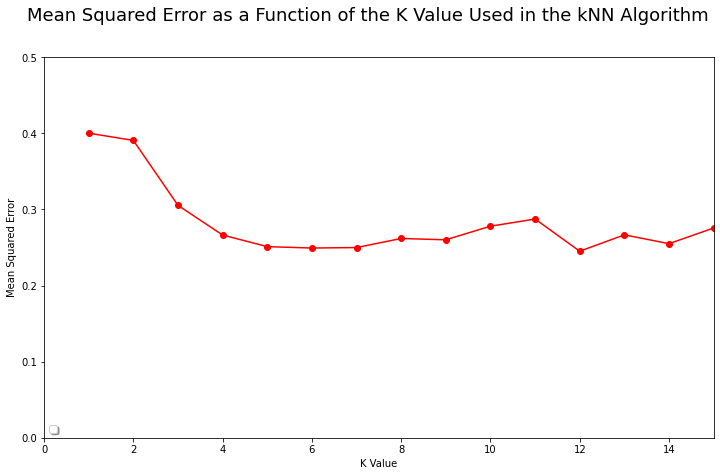

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 2, 0)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


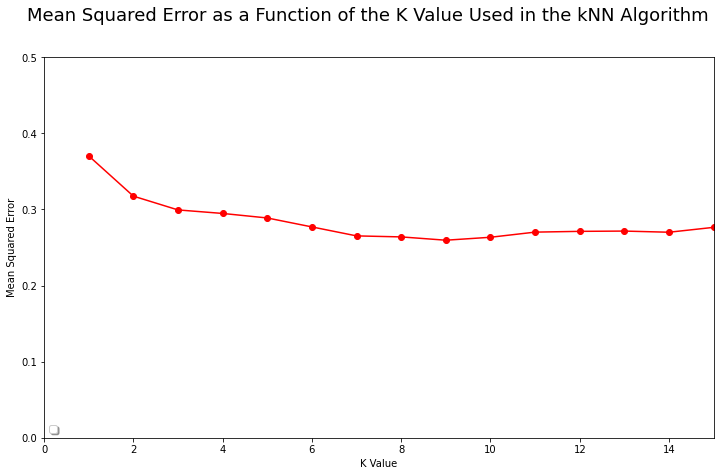

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 3, 41)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


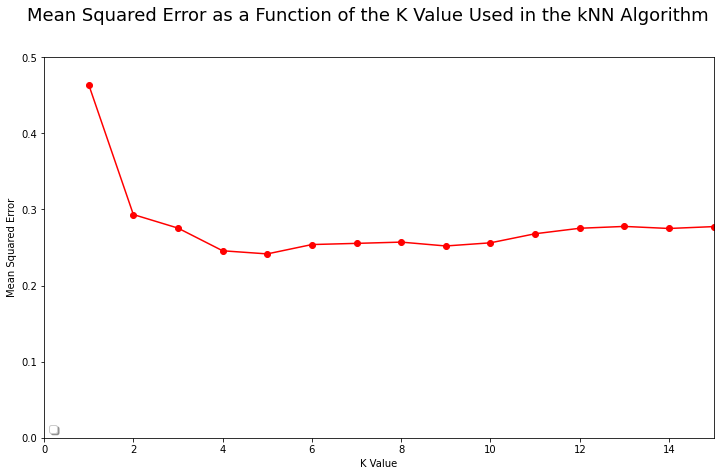

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 3, 66)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


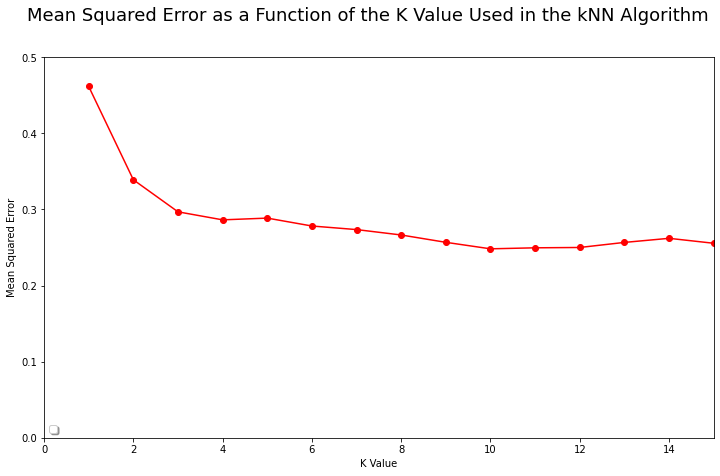

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 3, 158)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


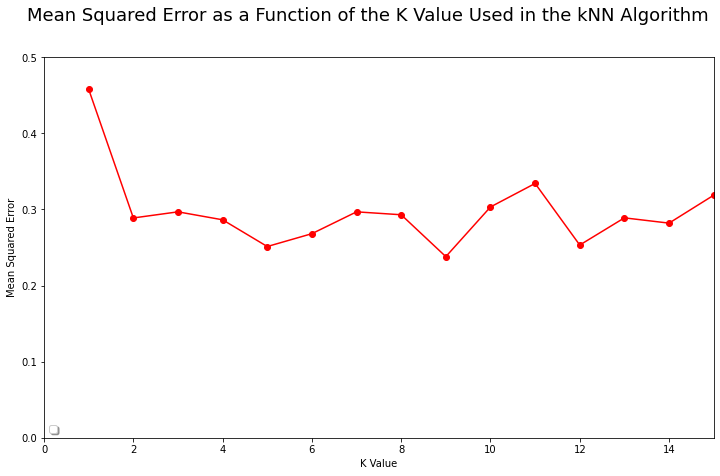

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('uniform', k, 3, 0)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

Based on the graphical results from each KNN algorithm with a different random state, the average k-nearest neighbors from the k-nearest neighbors values that yield the lowest mean squared errors is 7 when p=1, around 8 when p=2, and around 10 when p=3. Therefore, the optimal KNN algorithm is the one that has a k-nearest neighbors value of 7 and p=1 (Manhattan Distance). Similar to the reasoning behind creating an optimal decision tree, the optimal KNN will include no random state. Here is a picture that illustrates the graphical results from determining the optimal KNN algorithm.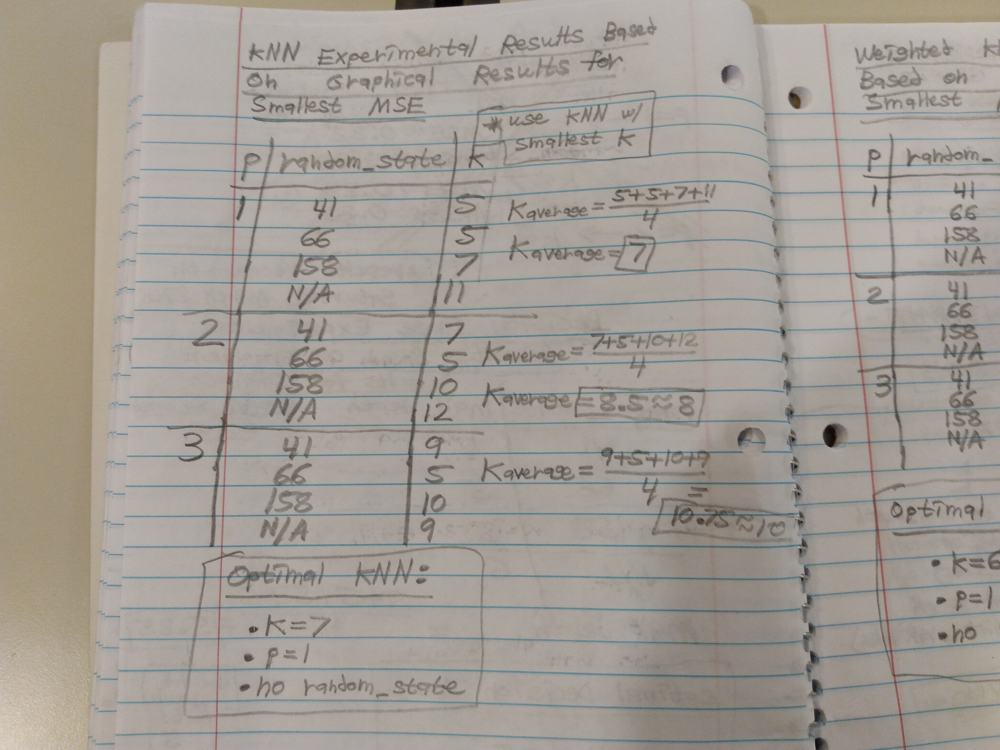

Based on the graphical results from each weighted KNN algorithm with a different random state, the average weighted k-nearest neighbors from the k-nearest neighbors values that yield the lowest mean squared errors is around 6 when p=1, 7 when p=2, and 7 when p=3. Therefore, the optimal weighted KNN algorithm is the one that has a k-nearest neighbors value of 6 and p=1 (Manhattan Distance). Similar to the reasoning behind creating an optimal decision tree, the optimal weighted KNN will include no random state. Here is a picture that illustrates the graphical results from determining the optimal KNN algorithm.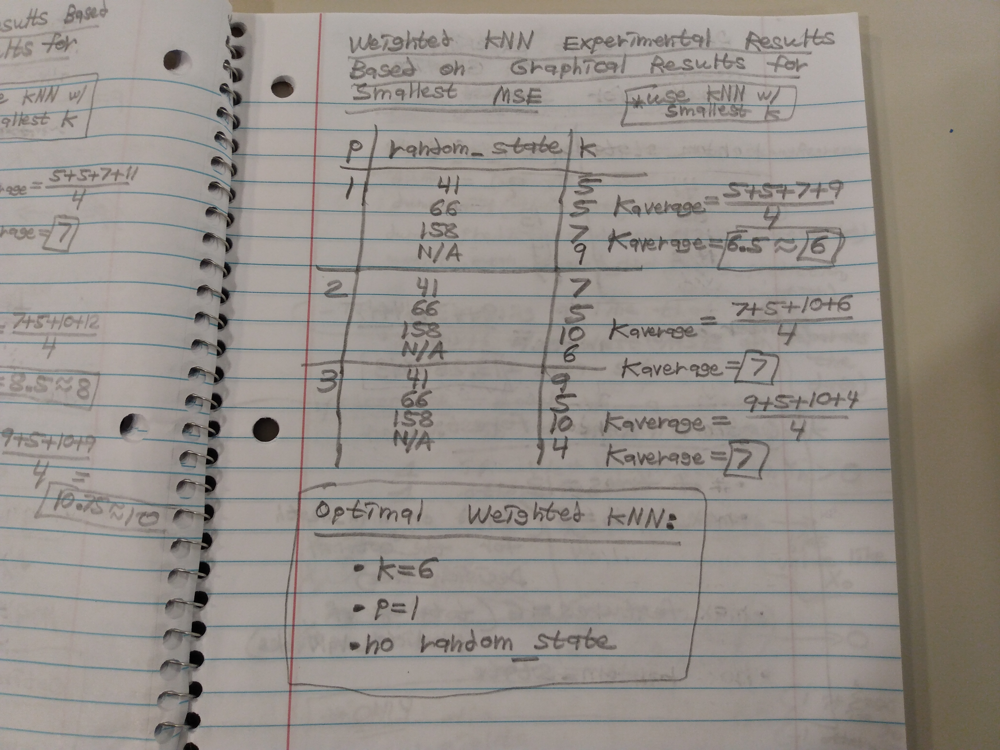

No handles with labels found to put in legend.


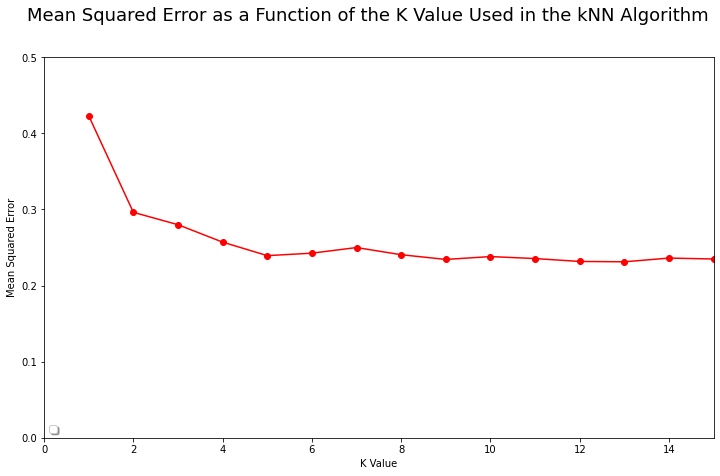

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 1, 41)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


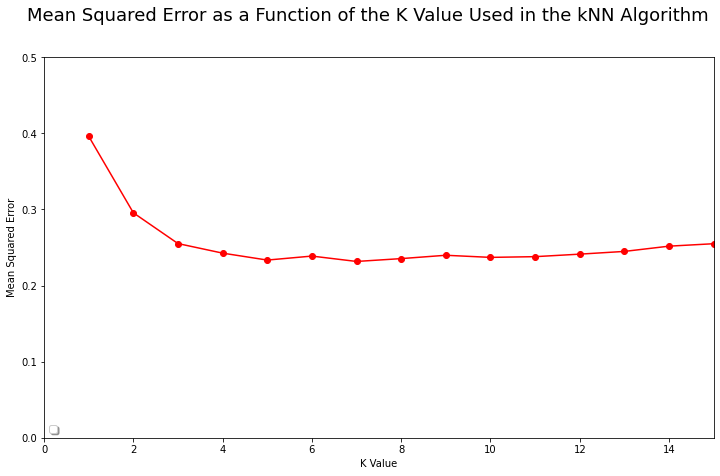

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 1, 66)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


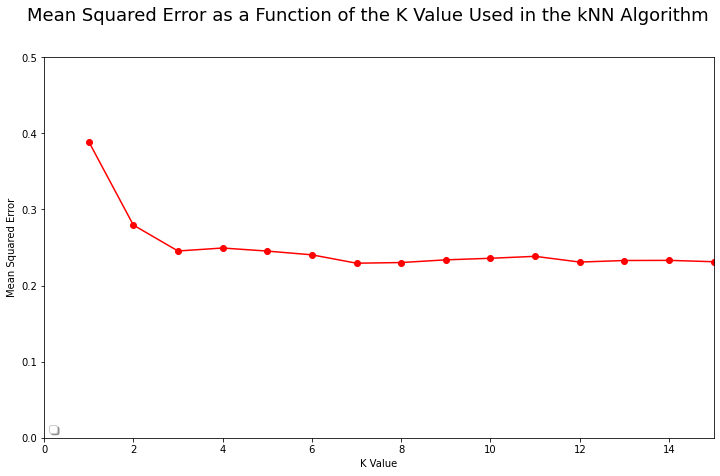

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 1, 158)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


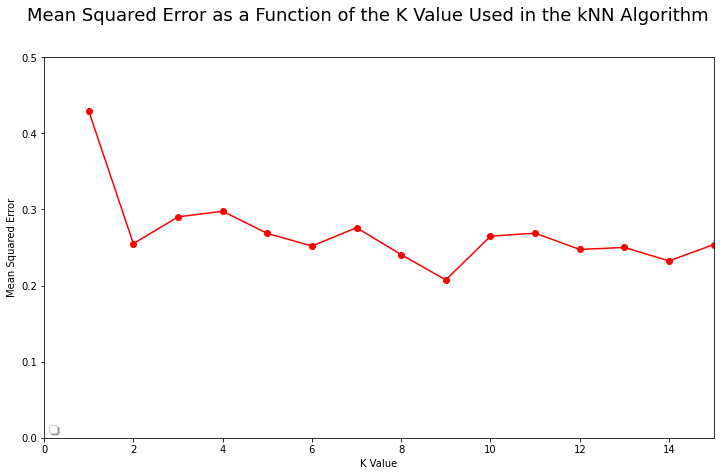

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 1, 0)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


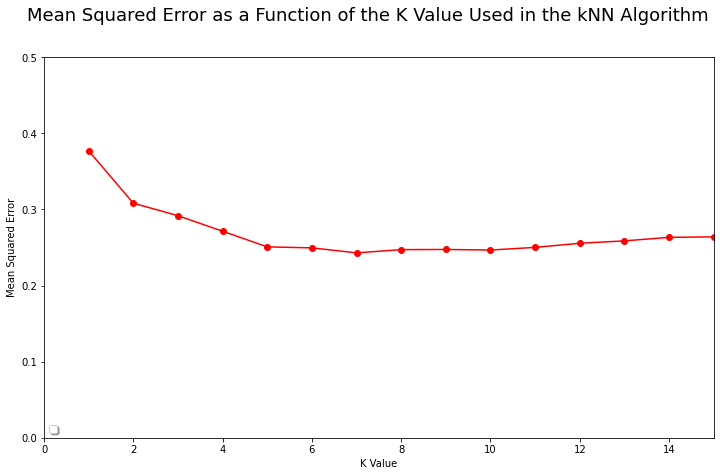

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 2, 41)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


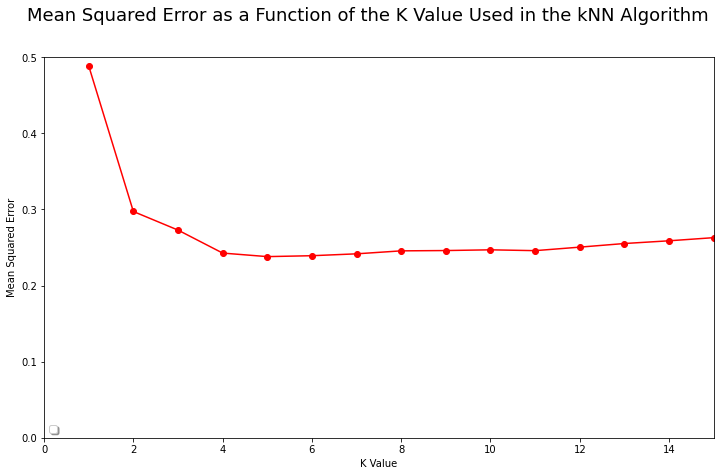

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 2, 66)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


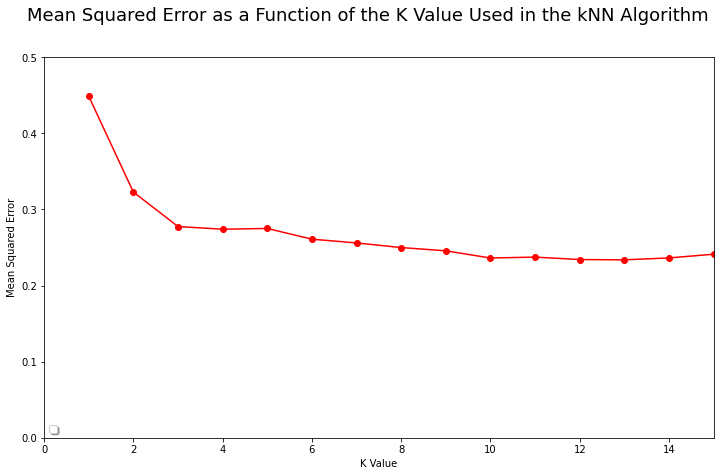

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 2, 158)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


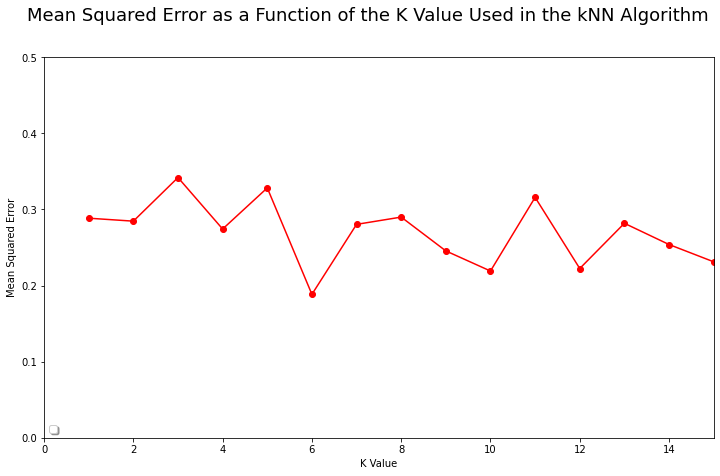

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 2, 0)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


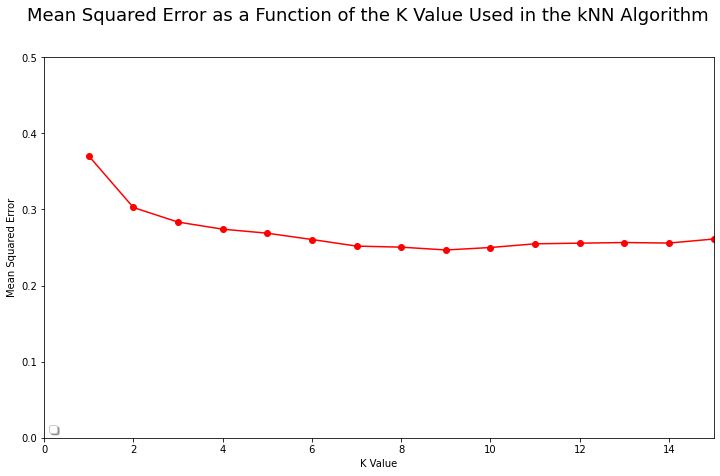

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 3, 41)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


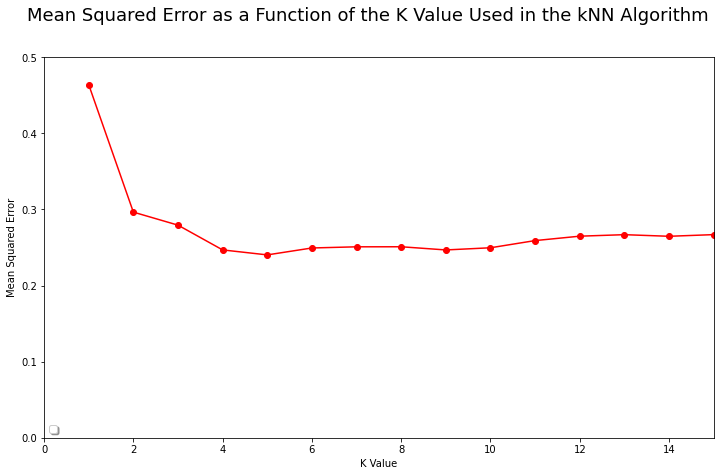

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 3, 66)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


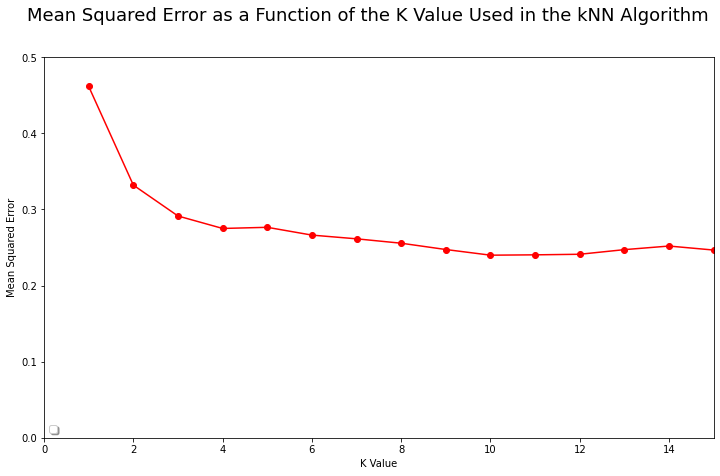

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 3, 158)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

No handles with labels found to put in legend.


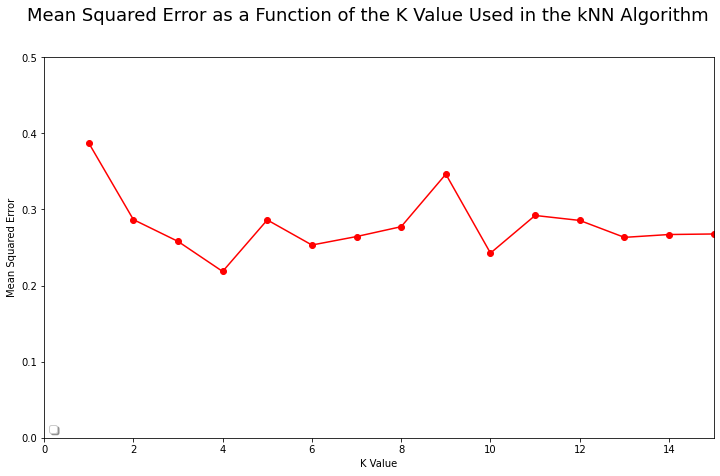

In [ ]:
k_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
mean_squared_error_values = []

for k in k_values:
  mean_squared_error = creatingKNeighborsRegressor('distance', k, 3, 0)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the K Value Used in the kNN Algorithm',fontsize=18)
plt.xlabel('K Value')
plt.ylabel('Mean Squared Error')
plt.plot(k_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,15,0,0.5])


plt.show()

In [ ]:
#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html - used this source to gain a better understanding of how to create a Random Forest
#creating a Python function that takes in the parameter number_of_trees that will be tuned when implementing Random Forests
def creatingRandomForestRegressor(number_of_trees, random_state):
  predictor_variables = ["GDP per capita","Social support and Family","Healthy life expectancy","Freedom to make life choices","Generosity","Perceptions of corruption"]
  target_variable = "Score"
  if random_state == 0:
    train_data, test_data, train_solution, test_solution = \
    train_test_split(happiness[predictor_variables], happiness[target_variable], test_size = 0.2)
    random_Forest = RandomForestRegressor(n_estimators=number_of_trees, max_depth=5, max_features=6)
    random_Forest.fit(train_data, train_solution)
    random_Forest_prediction = random_Forest.predict(test_data)
  else:
    train_data, test_data, train_solution, test_solution = \
    train_test_split(happiness[predictor_variables], happiness[target_variable], test_size = 0.2, random_state = random_state)
    random_Forest = RandomForestRegressor(n_estimators=number_of_trees, max_depth=5, max_features=6, random_state=random_state)
    random_Forest.fit(train_data, train_solution)
    random_Forest_prediction = random_Forest.predict(test_data)
    

  
  return metrics.mean_squared_error(test_solution, random_Forest_prediction)

No handles with labels found to put in legend.


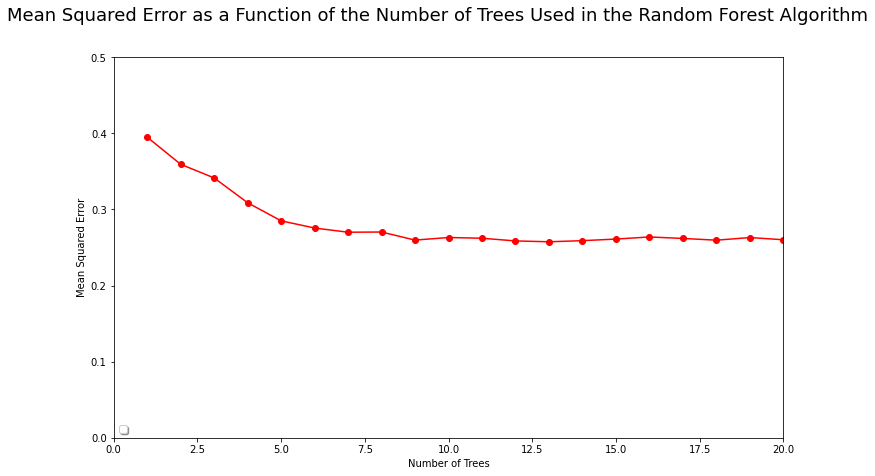

In [ ]:
#graphing the mean squared error values as a function of the number_of_trees values for random forests
tree_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
mean_squared_error_values = []

for number_of_trees in tree_values:
  mean_squared_error = creatingRandomForestRegressor(number_of_trees, 41)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the Number of Trees Used in the Random Forest Algorithm',fontsize=18)
plt.xlabel('Number of Trees')
plt.ylabel('Mean Squared Error')
plt.plot(tree_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,20,0,0.5])


plt.show()

No handles with labels found to put in legend.


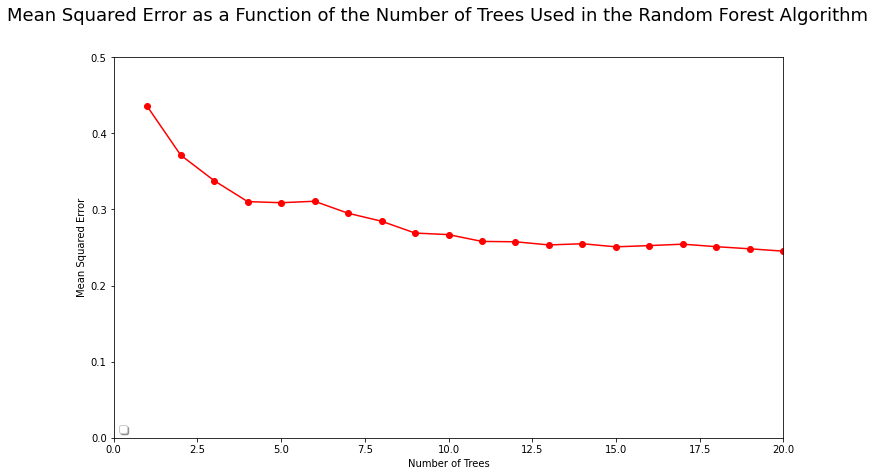

In [ ]:
tree_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
mean_squared_error_values = []

for number_of_trees in tree_values:
  mean_squared_error = creatingRandomForestRegressor(number_of_trees, 66)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the Number of Trees Used in the Random Forest Algorithm',fontsize=18)
plt.xlabel('Number of Trees')
plt.ylabel('Mean Squared Error')
plt.plot(tree_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,20,0,0.5])


plt.show()

No handles with labels found to put in legend.


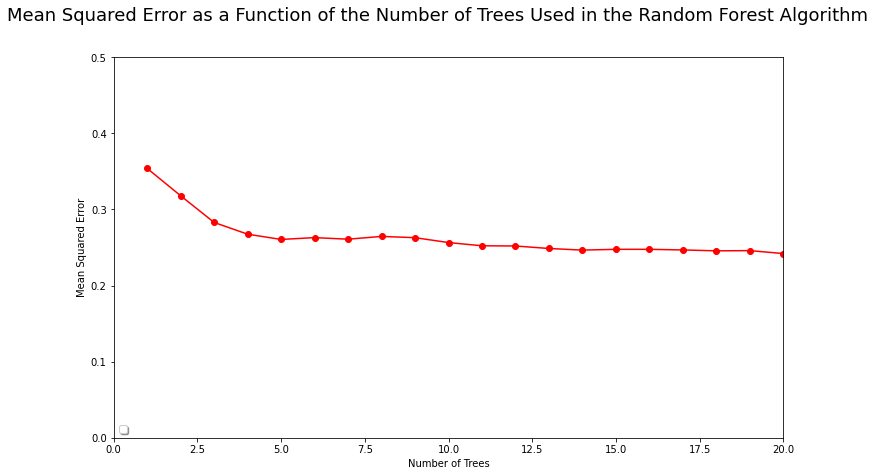

In [ ]:
tree_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
mean_squared_error_values = []

for number_of_trees in tree_values:
  mean_squared_error = creatingRandomForestRegressor(number_of_trees, 158)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the Number of Trees Used in the Random Forest Algorithm',fontsize=18)
plt.xlabel('Number of Trees')
plt.ylabel('Mean Squared Error')
plt.plot(tree_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,20,0,0.5])


plt.show()

No handles with labels found to put in legend.


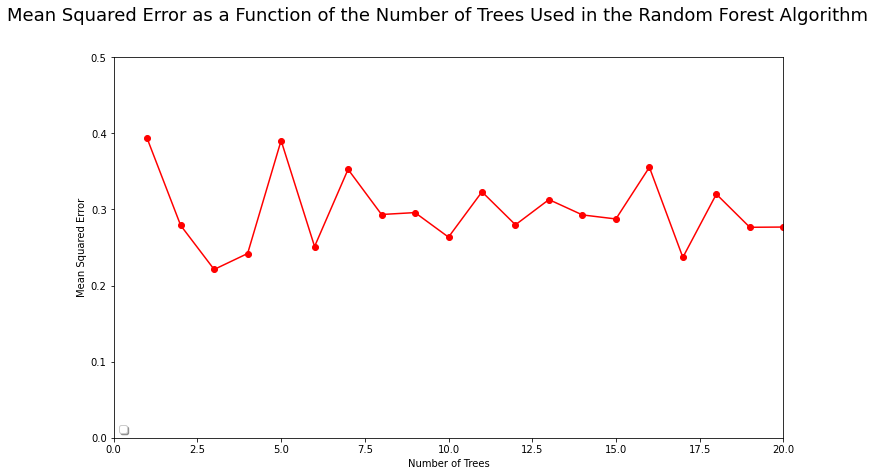

In [ ]:
tree_values = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
mean_squared_error_values = []

for number_of_trees in tree_values:
  mean_squared_error = creatingRandomForestRegressor(number_of_trees, 0)
  mean_squared_error_values.append(mean_squared_error)
  
  
  


  

figure_size = plt.figure()
figure_size.set_figwidth(12)
figure_size.set_figheight(7)
plt.suptitle('Mean Squared Error as a Function of the Number of Trees Used in the Random Forest Algorithm',fontsize=18)
plt.xlabel('Number of Trees')
plt.ylabel('Mean Squared Error')
plt.plot(tree_values, mean_squared_error_values, 'ro-')
plt.legend(loc='lower left', shadow=True)
plt.axis([0,20,0,0.5])


plt.show()

Based on the graphical results from each random forest with a different random state, the average number of decision trees from the number of decision trees that yield the lowest mean squared errors is 13.25, which can be rounded down to 13. Therefore, the optimal random forest that can be constructed is one that uses 13 decision trees to predict the target variable. Similar to all the previous machine learning models that were graphed, the optimal random forest will have no random state. Here is a picture that illustrates the graphical results from determining the optimal random forest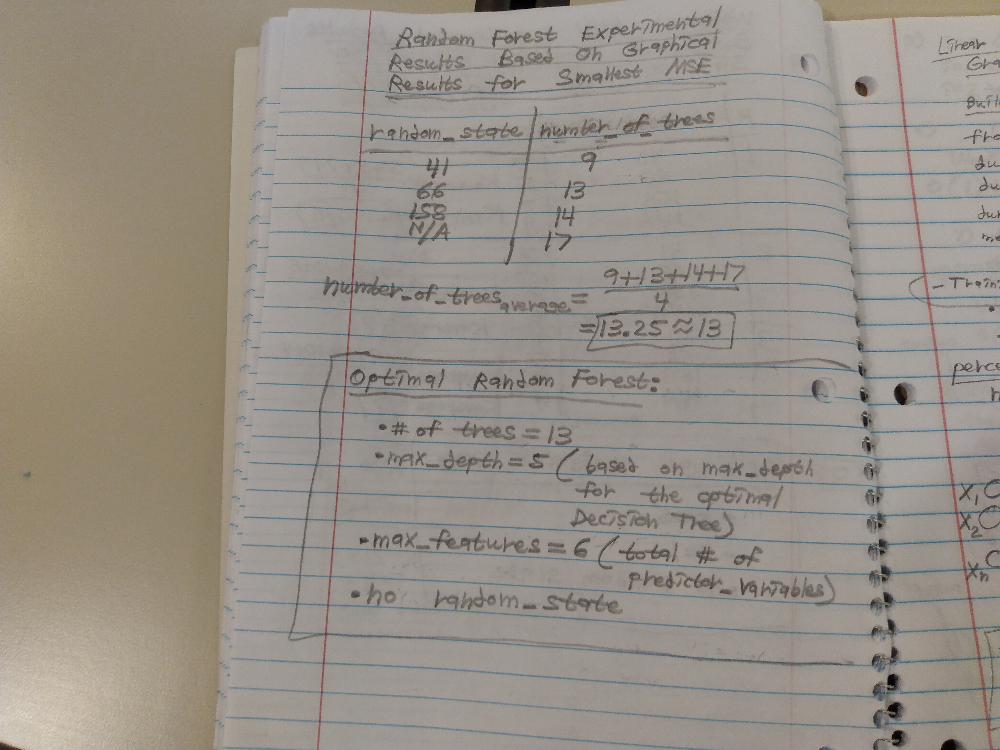.

I normalized the data, I hope to gain an even better sense of which of the optimal machine learning models would be the most beneficial for predicting the happiness score.

In [ ]:
#normalizing the data
predictor_variables = ["GDP per capita","Social support and Family","Healthy life expectancy","Freedom to make life choices","Generosity","Perceptions of corruption"]
target_variable = "Score"
train_data, test_data, train_solution, test_solution = \
train_test_split(happiness[predictor_variables], happiness[target_variable], test_size = 0.2)

scaler = StandardScaler()
scaler.fit(train_data)
train_data_normalized = scaler.transform(train_data)
test_data_normalized = scaler.transform(test_data)

In [ ]:
#creating the optimal decision tree (with normalization)

print(creatingDecisionTreeRegressor(5, 0))

0.41133734876160966


In [ ]:
#creating the optimal kNN Algorithm (with normalization)
print(creatingKNeighborsRegressor('uniform', 7, 1, 0))

0.284377888626114


In [ ]:
#creating the optimal weighted kNN Algorithm (with normalization)
print(creatingKNeighborsRegressor('distance', 6, 1, 0))

0.2479819724577185


In [ ]:
#creating the optimal random forest (with normalization)
print(creatingRandomForestRegressor(13, 0))

0.3199495690174822


In order to find the best features that predict the happiness score, I also printed out the mean squared error value of each optimal machine learning model (Decision Tree, KNN Algorithm, Weighted KNN Algorithm, and Random Forest). Fortunately, all of the optimal machine learning models yield a mean squared error of less than the baseline model's mean squared error of 0.973. However, the weighted KNN algorithm will be the most beneficial for predicting the happiness score, since the weighted KNN algorithm yields the smallest mean squared error compared to the other optimal machine learning models. Therefore, this means that all of the predictor variables are equally significant in predicting the happiness score.

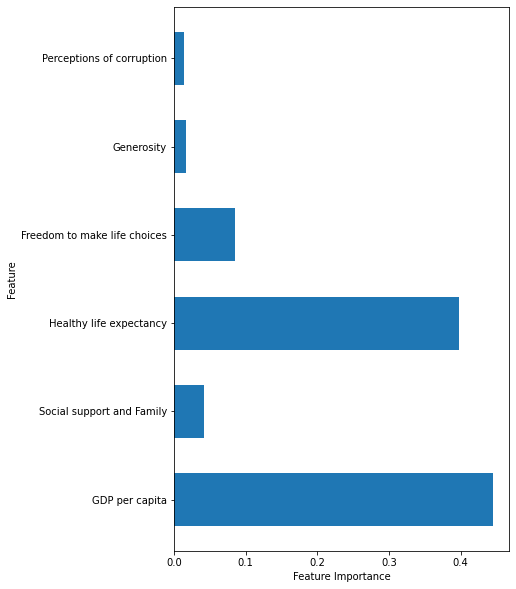

In [ ]:
#creating a feature importances chart

random_Forest = RandomForestRegressor(n_estimators=13, max_depth=5, max_features=6)
random_Forest.fit(train_data, train_solution)
random_Forest_prediction = random_Forest.predict(test_data)

number_of_features = range(len(predictor_variables))

plt.figure(figsize=(6,10))
plt.barh(number_of_features,random_Forest.feature_importances_,height=0.6)
plt.ylabel("Feature")
plt.yticks(number_of_features, predictor_variables)
plt.xlabel("Feature Importance")
plt.show()


Although all of the predictor variables are equally significant in predicting the happiness score, the feature importances chart may indicate which features may be slightly more significant for predicting the happiness score. Based on the results from the feature performances chart, "Healthy life expectancy" and "GDP per capita" are slightly more significant for predicting the happiness score. 

Therefore, it can be concluded that the features "Healthy life expectancy" and "GDP per capita" affect a country's happiness the most.